<a href="https://colab.research.google.com/github/Ankit1326/ankit-delta/blob/main/PD3d%20animation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

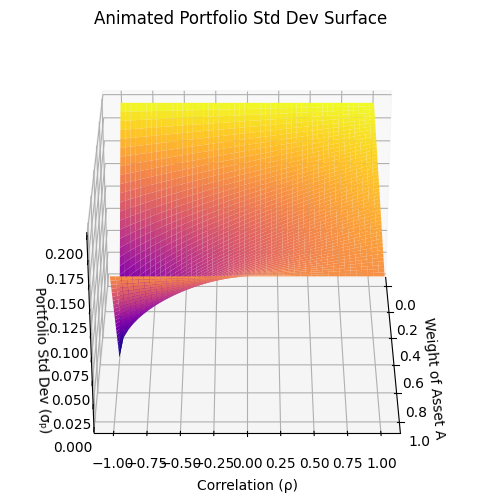

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import HTML

# Fixed volatilities
sigma_A = 0.15
sigma_B = 0.20

# Reduce resolution for Colab stability
weights = np.linspace(0, 1, 50)
correlations = np.linspace(-1, 1, 50)

W, Rho = np.meshgrid(weights, correlations)

# Portfolio Std Dev
portfolio_variance = (W**2)*(sigma_A**2) + ((1 - W)**2)*(sigma_B**2) + \
                     2 * W * (1 - W) * Rho * sigma_A * sigma_B
portfolio_std = np.sqrt(portfolio_variance)

# Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, Rho, portfolio_std, cmap='plasma', edgecolor='none')
ax.set_xlabel('Weight of Asset A')
ax.set_ylabel('Correlation (ρ)')
ax.set_zlabel('Portfolio Std Dev (σₚ)')
ax.set_title('Animated Portfolio Std Dev Surface')

# Animation
def rotate(angle):
    ax.view_init(elev=30, azim=angle)

ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, 5), interval=80)

# Display in Colab
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

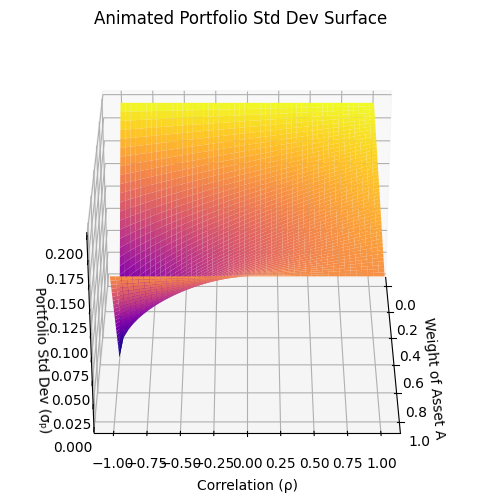

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import HTML

# 1. Define asset volatilities
sigma_A = 0.15  # 15%
sigma_B = 0.20  # 20%

# 2. Create weight and correlation ranges (reduced for smooth Colab performance)
weights = np.linspace(0, 1, 50)
correlations = np.linspace(-1, 1, 50)
W, Rho = np.meshgrid(weights, correlations)

# 3. Compute portfolio standard deviation
portfolio_variance = (W**2)*(sigma_A**2) + ((1 - W)**2)*(sigma_B**2) + \
                     2 * W * (1 - W) * Rho * sigma_A * sigma_B
portfolio_std = np.sqrt(portfolio_variance)

# 4. Create figure
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, Rho, portfolio_std, cmap='plasma', edgecolor='none')
ax.set_xlabel('Weight of Asset A')
ax.set_ylabel('Correlation (ρ)')
ax.set_zlabel('Portfolio Std Dev (σₚ)')
ax.set_title('Animated Portfolio Std Dev Surface')

# 5. Define rotation animation
def rotate(angle):
    ax.view_init(elev=30, azim=angle)

ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, 5), interval=80)

# 6. Save animation as GIF
ani.save('portfolio_std_surface.gif', writer='pillow', fps=15)

# 7. Download the GIF file (for Google Colab)
from google.colab import files
files.download('portfolio_std_surface.gif')
